# Wine Quality Prediction (DSCI522_group17)

## Exploratory Data Analysis

In [64]:
# uploading libraries
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import seaborn as sns

# Introduction

The data set used in this project is sourced from the UCI Machine Learning Repository. There are two datasets. One is for red wine while the other is for white wine. We will merge these two datasets together and create a new column type of wine to represent the wine type for each observation. In addition, we will group the quality of wine into three categories and they are "Bad", "Good", and "Excellent". In total, we have 12 predictors and one output variable.

In [41]:
#Uploading dataset for redwine
data_red= pd.read_csv("winequality-red.csv", ";")

In [42]:
#cleaning data
data_red = data_red.rename(columns=lambda x: x.replace(" ","_"))

#creating levels for 'quality_level' column
data_red['quality_level'] = ["Excellent" if x >= 7 else "Good" if x >= 5 else "Bad" for x in data_red['quality']]
data_red['wine_type']= "red"
#data_red.head()

In [40]:
#load data
data_red.sample(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_level
1307,6.8,0.68,0.09,3.9,0.068,15.0,29.0,0.99524,3.41,0.52,11.1,4,red,Bad
85,6.9,0.55,0.15,2.2,0.076,19.0,40.0,0.99610,3.41,0.59,10.1,5,red,Good
1355,6.1,0.32,0.25,1.8,0.086,5.0,32.0,0.99464,3.36,0.44,10.1,5,red,Good


In [43]:
#uploading white wine data set
data_white= pd.read_csv("winequality-white.csv", ";")

In [45]:
#cleaning data
data_white = data_white.rename(columns=lambda x: x.replace(" ","_"))

#creating levels for 'quality_level' column
data_white['quality_level'] = ["Excellent" if x >= 7 else "Good" if x >= 5 else "Bad" for x in data_white['quality']]
data_white['wine_type']= "white"

In [46]:
#dimension red wine data set
data_red.shape

(1599, 14)

In [47]:
#dimension white wine data set
data_white.shape

(4898, 14)

In [74]:
#merging red wine and white wine data set
full_data = pd.concat([data_white, data_red], axis=0)

In [49]:
#dimension of merged data set
full_data.shape

(6497, 14)

In [50]:
#first 4 lines of data set
full_data.head(4)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,quality_level,wine_type
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,Good,white
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,Good,white
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,Good,white
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,Good,white


# Spliting the data set into training and test sets

**Before starting our analysis, we will split the data into train data set (75%) and into training (25%) data set. Below is the list of the counts of observations for each class:**

In [66]:
#split
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(full_data, test_size=0.25, random_state=123)

#dimension of train data set
train_df.shape

(4872, 14)

In [67]:
#dimension of test data set
test_df.shape

(1625, 14)

# Exploratory data analysis (EDA) by using pandas profile Python module and Seaborn Python library

In [57]:
profile = ProfileReport(train_df)

In [58]:
profile

In [59]:
profile.to_file(output_file="output.html")

### Boxplot to analysis outliers

IndexError: index 12 is out of bounds for axis 0 with size 12

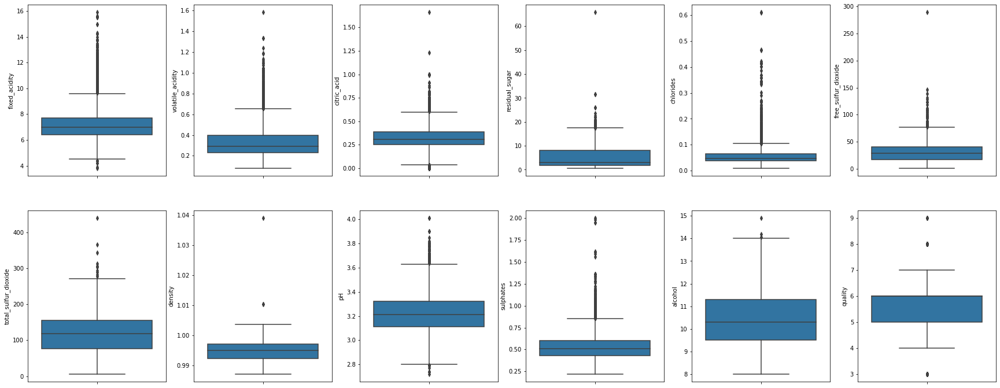

In [72]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(30,12))
index=0
ax= ax.flatten()

for col, value in train_df.items():
    sns.boxplot(y=col, data=full_data , ax=ax[index])
    index +=1
    
plt.tight_layout(pad=0.5, w_pad=0.7)    

### Density plot to analysis data distribution

C:\miniconda3\envs\Supervised_Learning_571\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\miniconda3\envs\Supervised_Learning_571\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\miniconda3\envs\Supervised_Learning_571\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level functio

IndexError: index 12 is out of bounds for axis 0 with size 12

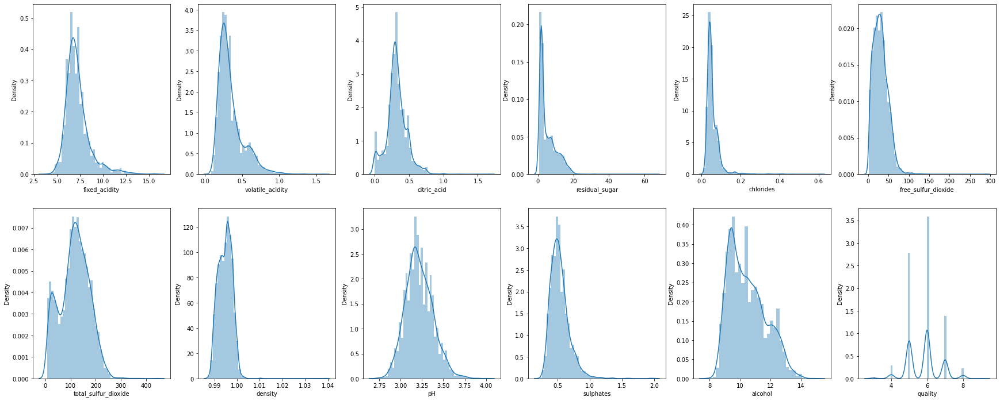

In [61]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(30,12))
index=0
ax= ax.flatten()

for col, value in train_df.items():
    sns.distplot(value, ax=ax[index])
    index +=1
    
plt.tight_layout(pad=0.5, w_pad=0.7) 

### Seaborn pairplot to analysis the interaction between variables

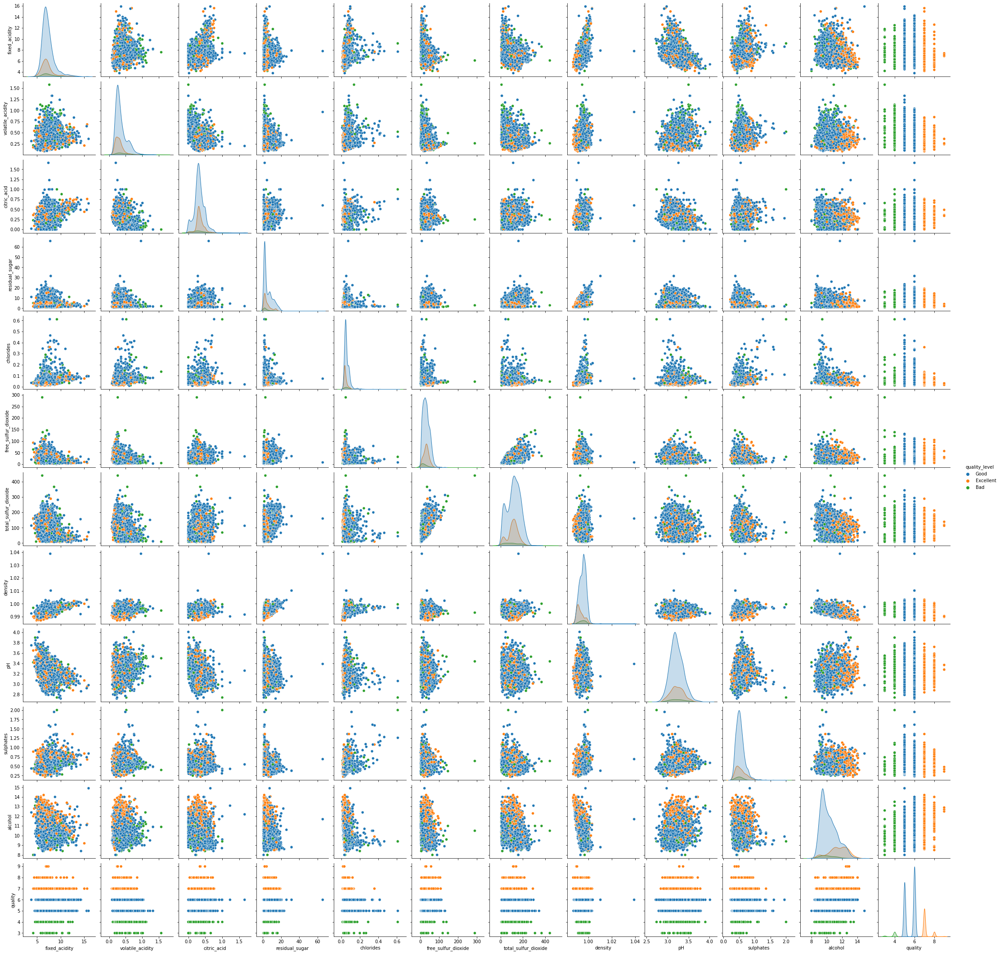

In [62]:
sns.pairplot(train_df, hue="quality_level")

# Observations

- There is no missing values in the training data set
- Some of the variables such as fixed_acidity, volatile_acidity etc. are right skewed and need a treatment
- There are outliers in some variables such as Density Residual sugar, Free sulfur dioxide. Treatment is needed before further analysis.

# References

This data analysis in inspired from the site: https://github.com/ttimbers/breast_cancer_predictor/blob/v1.1/src/breast_cancer_eda.Rmd